# Galaxy10 Pipeline - Data Exploration

This notebook loads and explores the Galaxy10 DECals dataset.



# 🪐 Galaxy10 DECals Dataset — Summary

The **Galaxy10 DECals** dataset is a curated astronomical image collection derived from the **Dark Energy Camera Legacy Survey (DECaLS)** and the **Galaxy Zoo** citizen science project.  
It contains **17,736 RGB images** of galaxies, each sized **256 × 256 × 3**, representing **10 distinct morphological classes**.

### 📦 Dataset Composition
- **Total samples:** 17,736  
- **Image resolution:** 256 × 256 × 3 (RGB)  
- **Number of classes:** 10  
- **Label type:** Visual morphology class from *Galaxy Zoo DECaLS*  
- **Format:** HDF5 (`Galaxy10_DECals.h5`)  
- **License:** Freely available for research and academic use

### 🧭 Class Descriptions
The ten classes represent major galaxy morphologies, including:
1. Disk  
2. Smooth (elliptical)  
3. Edge-on disk  
4. Merging systems  
5. Ring galaxies  
6. Spiral (tight arms)  
7. Spiral (medium arms)  
8. Spiral (loose arms)  
9. Barred spirals  
10. Irregular / uncertain structures

### 🧪 Scientific Context
Galaxy10 DECals extends the *Galaxy Zoo 2* classification efforts with deeper imaging and automated labeling.  
It serves as a benchmark dataset for **deep learning–based galaxy morphology classification**, **transfer learning**, and **representation learning**.

### 📚 Citation
Walmsley, M., Lintott, C., Bamford, S. P., Masters, K., Simmons, B., Kruk, S., Keel, W., & Dickinson, H. (2020).  
*Galaxy Zoo DECaLS: Detailed visual morphology measurements from volunteers and deep learning for 314,000 galaxies.*  
**Monthly Notices of the Royal Astronomical Society, 491(2), 1554–1574.**  
DOI: [10.1093/mnras/stz2816](https://doi.org/10.1093/mnras/stz2816)


## 1. Setup and Imports

In [1]:
import sys
import os
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Add project root to path
project_root = os.path.abspath('..')
if project_root not in sys.path:
    sys.path.insert(0, project_root)

from src.config import DATASET_PATH, CLASS_NAMES, N_JOBS

# Configure plotting
%matplotlib inline
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')
plt.rcParams['figure.figsize'] = (12, 8)

print(f"✓ Imports complete")
print(f"✓ Using {N_JOBS} CPU cores for parallel processing")
print(f"✓ Dataset path: {DATASET_PATH}")

Configuration loaded: Using 21 CPU cores for parallel processing
✓ Imports complete
✓ Using 21 CPU cores for parallel processing
✓ Dataset path: /home/salix/Documents/Galaxy10_DECals.h5


## 2. Load Galaxy10 Dataset

In [2]:
def load_galaxy10_dataset(h5_path):
    """
    Load Galaxy10 DECals dataset from H5 file.
    
    Args:
        h5_path: Path to Galaxy10_DECals.h5 file
        
    Returns:
        images: numpy array of shape (17736, 256, 256, 3)
        labels: numpy array of shape (17736,)
    """
    print(f"Loading dataset from: {h5_path}")
    
    if not os.path.exists(h5_path):
        raise FileNotFoundError(f"Dataset not found at {h5_path}")
    
    with h5py.File(h5_path, 'r') as f:
        print(f"\nH5 file keys: {list(f.keys())}")
        
        # Load images and labels
        images = np.array(f['images'])
        labels = np.array(f['ans'])
        
        print(f"\n✓ Loaded {len(images):,} images")
        print(f"✓ Image shape: {images.shape}")
        print(f"✓ Labels shape: {labels.shape}")
        print(f"✓ Image dtype: {images.dtype}")
        print(f"✓ Label dtype: {labels.dtype}")
        
    return images, labels

# Load the dataset
images, labels = load_galaxy10_dataset(DATASET_PATH)

Loading dataset from: /home/salix/Documents/Galaxy10_DECals.h5

H5 file keys: ['ans', 'dec', 'images', 'pxscale', 'ra', 'redshift']

✓ Loaded 17,736 images
✓ Image shape: (17736, 256, 256, 3)
✓ Labels shape: (17736,)
✓ Image dtype: uint8
✓ Label dtype: uint8


## 3. Validate Dataset

In [3]:
def validate_dataset(images, labels):
    """
    Validate dataset integrity and compute statistics.
    
    Args:
        images: Image array
        labels: Label array
        
    Returns:
        stats: Dictionary of dataset statistics
    """
    print("Validating dataset...\n")
    
    stats = {}
    
    # Check shapes
    assert images.shape == (17736, 256, 256, 3), f"Unexpected image shape: {images.shape}"
    assert labels.shape == (17736,), f"Unexpected label shape: {labels.shape}"
    print("✓ Shapes validated")
    
    # Check label range
    assert np.all((labels >= 0) & (labels <= 9)), "Labels outside valid range [0-9]"
    print("✓ Label range validated [0-9]")
    
    # Check for NaN or Inf
    assert not np.any(np.isnan(images)), "Images contain NaN values"
    assert not np.any(np.isinf(images)), "Images contain Inf values"
    print("✓ No NaN or Inf values")
    
    # Compute statistics
    stats['n_samples'] = len(images)
    stats['image_shape'] = images.shape[1:]
    stats['n_classes'] = len(np.unique(labels))
    stats['pixel_min'] = images.min()
    stats['pixel_max'] = images.max()
    stats['pixel_mean'] = images.mean()
    stats['pixel_std'] = images.std()
    
    # Class distribution
    class_counts = Counter(labels)
    stats['class_distribution'] = dict(sorted(class_counts.items()))
    
    # Check for class imbalance
    min_count = min(class_counts.values())
    max_count = max(class_counts.values())
    stats['imbalance_ratio'] = max_count / min_count
    
    print(f"\n📊 Dataset Statistics:")
    print(f"  Total samples: {stats['n_samples']:,}")
    print(f"  Image shape: {stats['image_shape']}")
    print(f"  Number of classes: {stats['n_classes']}")
    print(f"  Pixel value range: [{stats['pixel_min']:.2f}, {stats['pixel_max']:.2f}]")
    print(f"  Pixel mean: {stats['pixel_mean']:.2f}")
    print(f"  Pixel std: {stats['pixel_std']:.2f}")
    print(f"  Class imbalance ratio: {stats['imbalance_ratio']:.2f}x")
    
    if stats['imbalance_ratio'] > 5:
        print(f"  ⚠️  High class imbalance detected!")
    
    return stats

# Validate the dataset
stats = validate_dataset(images, labels)

Validating dataset...

✓ Shapes validated
✓ Label range validated [0-9]
✓ No NaN or Inf values

📊 Dataset Statistics:
  Total samples: 17,736
  Image shape: (256, 256, 3)
  Number of classes: 10
  Pixel value range: [0.00, 255.00]
  Pixel mean: 41.57
  Pixel std: 30.53
  Class imbalance ratio: 7.92x
  ⚠️  High class imbalance detected!


## 4. Class Distribution Analysis

In [4]:
# Create class distribution DataFrame
class_dist_df = pd.DataFrame([
    {'Class ID': i, 'Class Name': CLASS_NAMES[i], 'Count': stats['class_distribution'][i]}
    for i in range(len(CLASS_NAMES))
])

class_dist_df['Percentage'] = (class_dist_df['Count'] / class_dist_df['Count'].sum() * 100).round(2)

print("\n📊 Class Distribution:")
print(class_dist_df.to_string(index=False))

# Save to artifacts
os.makedirs('../artifacts/visualizations', exist_ok=True)
class_dist_df.to_csv('../artifacts/visualizations/class_distribution.csv', index=False)
print("\n✓ Saved class distribution to artifacts/visualizations/class_distribution.csv")


📊 Class Distribution:
 Class ID              Class Name  Count  Percentage
        0      Disturbed Galaxies   1081        6.09
        1        Merging Galaxies   1853       10.45
        2            Round Smooth   2645       14.91
        3 In-between Round Smooth   2027       11.43
        4     Cigar-Shaped Smooth    334        1.88
        5           Barred Spiral   2043       11.52
        6   Unbarred Tight Spiral   1829       10.31
        7   Unbarred Loose Spiral   2628       14.82
        8      Edge-on with Bulge   1423        8.02
        9   Edge-on without Bulge   1873       10.56

✓ Saved class distribution to artifacts/visualizations/class_distribution.csv


## 5. Visualize Class Distribution

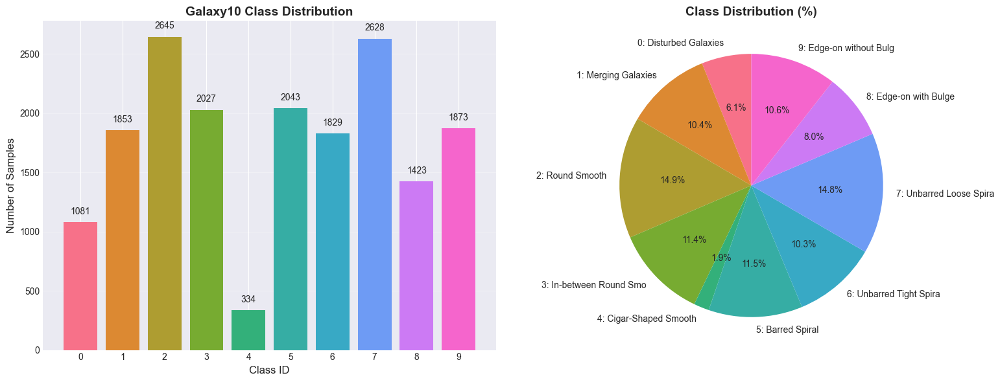

✓ Saved visualization to artifacts/visualizations/class_distribution.png


In [5]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
ax1.bar(range(len(CLASS_NAMES)), 
        [stats['class_distribution'][i] for i in range(len(CLASS_NAMES))],
        color=sns.color_palette('husl', len(CLASS_NAMES)))
ax1.set_xlabel('Class ID', fontsize=12)
ax1.set_ylabel('Number of Samples', fontsize=12)
ax1.set_title('Galaxy10 Class Distribution', fontsize=14, fontweight='bold')
ax1.set_xticks(range(len(CLASS_NAMES)))
ax1.grid(axis='y', alpha=0.3)

# Add count labels on bars
for i, count in enumerate([stats['class_distribution'][i] for i in range(len(CLASS_NAMES))]):
    ax1.text(i, count + 50, str(count), ha='center', va='bottom', fontsize=10)

# Pie chart
ax2.pie([stats['class_distribution'][i] for i in range(len(CLASS_NAMES))],
        labels=[f"{i}: {name[:20]}" for i, name in enumerate(CLASS_NAMES)],
        autopct='%1.1f%%',
        colors=sns.color_palette('husl', len(CLASS_NAMES)),
        startangle=90)
ax2.set_title('Class Distribution (%)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('../artifacts/visualizations/class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Saved visualization to artifacts/visualizations/class_distribution.png")

## 6. Visualize Sample Images

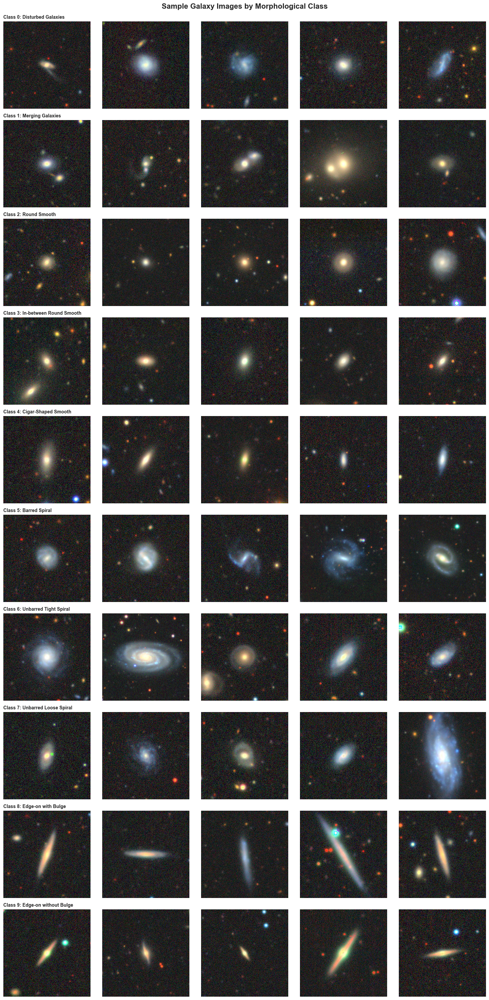

✓ Saved sample images to artifacts/visualizations/sample_images_grid.png


In [6]:
def visualize_class_samples(images, labels, n_samples=5):
    """
    Display sample images for each morphological class.
    
    Args:
        images: Image array
        labels: Label array
        n_samples: Number of samples per class to display
    """
    n_classes = len(CLASS_NAMES)
    fig, axes = plt.subplots(n_classes, n_samples, figsize=(n_samples * 3, n_classes * 3))
    
    for class_id in range(n_classes):
        # Get indices for this class
        class_indices = np.where(labels == class_id)[0]
        
        # Randomly sample n_samples
        sample_indices = np.random.choice(class_indices, size=min(n_samples, len(class_indices)), replace=False)
        
        for i, idx in enumerate(sample_indices):
            ax = axes[class_id, i] if n_classes > 1 else axes[i]
            
            # Normalize image to [0, 1] for display
            img = images[idx]
            if img.max() > 1.0:
                img = img / 255.0
            
            ax.imshow(img)
            ax.axis('off')
            
            if i == 0:
                ax.set_title(f"Class {class_id}: {CLASS_NAMES[class_id]}", 
                           fontsize=10, fontweight='bold', loc='left')
    
    plt.suptitle('Sample Galaxy Images by Morphological Class', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig('../artifacts/visualizations/sample_images_grid.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("✓ Saved sample images to artifacts/visualizations/sample_images_grid.png")

# Visualize samples
np.random.seed(42)  # For reproducibility
visualize_class_samples(images, labels, n_samples=5)

## 7. Pixel Value Distribution Analysis

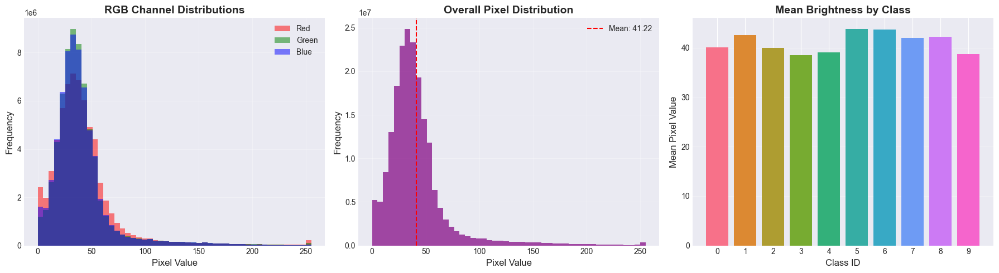

✓ Saved pixel distribution analysis to artifacts/visualizations/pixel_distribution_analysis.png


In [7]:
# Sample 1000 random images for pixel analysis (to save memory)
sample_indices = np.random.choice(len(images), size=1000, replace=False)
sample_images = images[sample_indices]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# RGB channel distributions
for channel, color, name in zip([0, 1, 2], ['red', 'green', 'blue'], ['Red', 'Green', 'Blue']):
    channel_data = sample_images[:, :, :, channel].flatten()
    axes[0].hist(channel_data, bins=50, alpha=0.5, label=name, color=color)

axes[0].set_xlabel('Pixel Value', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('RGB Channel Distributions', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Overall pixel distribution
all_pixels = sample_images.flatten()
axes[1].hist(all_pixels, bins=50, color='purple', alpha=0.7)
axes[1].set_xlabel('Pixel Value', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Overall Pixel Distribution', fontsize=14, fontweight='bold')
axes[1].axvline(all_pixels.mean(), color='red', linestyle='--', label=f'Mean: {all_pixels.mean():.2f}')
axes[1].legend()
axes[1].grid(alpha=0.3)

# Per-class mean brightness
class_brightness = []
for class_id in range(len(CLASS_NAMES)):
    class_mask = labels[sample_indices] == class_id
    if class_mask.sum() > 0:
        class_brightness.append(sample_images[class_mask].mean())
    else:
        class_brightness.append(0)

axes[2].bar(range(len(CLASS_NAMES)), class_brightness, 
           color=sns.color_palette('husl', len(CLASS_NAMES)))
axes[2].set_xlabel('Class ID', fontsize=12)
axes[2].set_ylabel('Mean Pixel Value', fontsize=12)
axes[2].set_title('Mean Brightness by Class', fontsize=14, fontweight='bold')
axes[2].set_xticks(range(len(CLASS_NAMES)))
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('../artifacts/visualizations/pixel_distribution_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Saved pixel distribution analysis to artifacts/visualizations/pixel_distribution_analysis.png")

## 8. Summary Report

In [ ]:
print("="*70)
print("📊 GALAXY10 DATASET EXPLORATION SUMMARY")
print("="*70)
print(f"\n✓ Dataset loaded successfully from: {DATASET_PATH}")
print(f"\n📈 Dataset Overview:")
print(f"  • Total samples: {stats['n_samples']:,}")
print(f"  • Image dimensions: {stats['image_shape']}")
print(f"  • Number of classes: {stats['n_classes']}")
print(f"  • Pixel value range: [{stats['pixel_min']:.2f}, {stats['pixel_max']:.2f}]")
print(f"  • Mean pixel value: {stats['pixel_mean']:.2f} ± {stats['pixel_std']:.2f}")
print(f"\n⚖️  Class Balance:")
print(f"  • Imbalance ratio: {stats['imbalance_ratio']:.2f}x")
print(f"  • Smallest class: {min(stats['class_distribution'].values())} samples")
print(f"  • Largest class: {max(stats['class_distribution'].values())} samples")
print(f"\n Artifacts Generated:")
print(f"  • artifacts/visualizations/class_distribution.csv")
print(f"  • artifacts/visualizations/class_distribution.png")
print(f"  • artifacts/visualizations/sample_images_grid.png")
print(f"  • artifacts/visualizations/pixel_distribution_analysis.png")
print(f"\n Next Steps:")
print(f"  1. Run 02_model_embeddings.ipynb to extract features from 4 pre-trained models")
print(f"  2. This will generate embeddings for all {stats['n_samples']:,} images")
print(f"  3. Embeddings will be cached for fast reuse")
print("\n" + "="*70)
print(" Data exploration complete! Ready for embedding extraction.")
print("="*70)

📊 GALAXY10 DATASET EXPLORATION SUMMARY

✓ Dataset loaded successfully from: /home/salix/Documents/Galaxy10_DECals.h5

📈 Dataset Overview:
  • Total samples: 17,736
  • Image dimensions: (256, 256, 3)
  • Number of classes: 10
  • Pixel value range: [0.00, 255.00]
  • Mean pixel value: 41.57 ± 30.53

⚖️  Class Balance:
  • Imbalance ratio: 7.92x
  • Smallest class: 334 samples
  • Largest class: 2645 samples

💾 Artifacts Generated:
  • artifacts/visualizations/class_distribution.csv
  • artifacts/visualizations/class_distribution.png
  • artifacts/visualizations/sample_images_grid.png
  • artifacts/visualizations/pixel_distribution_analysis.png

🎯 Next Steps:
  1. Run 02_model_embeddings.ipynb to extract features from 4 pre-trained models
  2. This will generate embeddings for all 17,736 images
  3. Embeddings will be cached for fast reuse

✅ Data exploration complete! Ready for embedding extraction.
